<a href="https://colab.research.google.com/github/jansoe/AICA/blob/main/MelSpectrogram.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Was ist Schall und wie werden Töne im Computer repräsentiert?

Bewegungen von Materie führen zu Druck- und Dichteschwankungen in der Luft (oder in anderen Stoffen). Diese als Schall bezeichneten Schwingungen nehmen wir insbesondere mit Hilfe unserer Ohren wahr. Die Frequenz dieser Schwingungen entscheidet dabei über die *Höhe* der wahrgenommenen Töne. Das menschliche Ohr nimmt im Idealfall Töne zwischen etwa 20 Hz (Hertz = Schwingungen pro Sekunde) und 20.000 Hz wahr.

Beim Aufzeichnen von Schall wandelt eine Membran in einem Mikrofon die mechanischen Schwingungen der (Luft-) Teilchen in eine elektrische Spannungsänderung um. Mit analogen Aufnahmemedien wie zum Beispiel einem Magnetband kann diese Spannungskurve kontinuierlich aufgezeichnet werden.

Um vom Computer digitaltechnisch verarbeitet werden zu können, muss das Signal in eine Reihe von Zahlen umgewandelt werden. In sogenannten Analog-Digital-Wandlern werden dafür in bestimmten Zeitabständen Messwerte (engl. Samples) des Signals festgehalten. Die folgende Abbildung stellt dies anhand des Signals `s` dar, das sich über die Zeit `t` ändert.

![](https://drive.google.com/uc?id=1s4LAWw0ngUf7OiRdhis1vSDymntQrlCT)

Quelle: https://commons.wikimedia.org/wiki/File:Analog_digital_series.svg

Die Qualität des digitalisierten Signals hängt dabei einerseits von der Abtastrate (Sampling Rate) ab, also von der Häufigkeit, mit der Messwerte festgehalten werden. Um Schwingungen einigermaßen sinnvoll abbilden zu können, sollte die Abtastrate höher sein als das Doppelte der höchsten im abzutastenden Signal vorhandenen Frequenz. Entsprechend wurde z.B. als Standard für die Audio-CD eine an die menschliche Wahrnehmungsfähigkeit angepasste Abtastrate von 44.100 Hz gewählt.

Der zweite Faktor, der die Qualität eines digitalen Audiosignals bestimmt, ist die Auflösung, mit der jeder einzelne Messpunkt abgespeichert wird - also die entsprechende Anzahl an Bits. Im Fall der Audio-CD werden 16 bit pro Messwert verwendet. Das bedeutet, dass jede einzelne gemessene Signalstärke (Amplitude) vom Audiosignal in digitaler Form 65536 unterschiedliche Werte annehmen kann.

---

**Anmerkungen**

In Bezug auf die minimale Abtastrate spricht man auch von der sogenannten [Nyquist Frequenz](https://de.wikipedia.org/wiki/Nyquist-Shannon-Abtasttheorem) ($f_{abtast} > 2\cdot f_{max}$).

### Laden und Abspielen von Audiodaten

Rohe Audiodaten werden gewöhnlich als *.wav*-Datei gespeichert. Diese Dateien enthalten für jeden Messzeitpunkt einen Wert. Genau wie beim Bilddateiformat *.bmp*, bei dem die Farbwerte der einzelnen Pixel unabhängig voneinander abgespeichert werden, ist diese Technik der Datenrepräsentation sehr ineffizient im Hinblick auf den benötigten Speicherplatz. Um diesen zu verringern, werden heutzutage komprimierte Formate wie z.B. *.mp3* für Audio- und *.jpg* für Bilddaten verwendet. Im Fall der Audiodaten werden dabei Effekte der [Psychoakustik](https://de.wikipedia.org/wiki/Psychoakustik) ausgenutzt, um nur die Aspekte des Schalls abspeichern zu müssen, die für den Menschen auch wahrnehmbar sind. Für die Weiterverarbeitung von Signalen müssen wir die Daten aber in der Regel wieder in ihre unkomprimierte Form bringen.

Wie Sie vielleicht schon gemerkt haben ist ein häufiger erster Schritt bei der Datenverarbeitung in Python das Umwandeln aller Daten in *numpy ndarrays*. Für diesen Zweck benutzen wir hier die Bibliothek `librosa`, die auch umfangreiche Funktionen zur Weiterverarbeitung von Audiodaten bietet.

In [1]:
import numpy as np
from matplotlib import pyplot as plt
import librosa
import librosa.display

Im Rahmen dieses Notebooks benötigen Sie Zugriff auf Ihr Google Drive.

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


`librosa` bietet uns die Möglichkeit, Sound-Dateien in vielen verschiedenen Formaten zu laden. Laden Sie [diese mp3-Datei](https://drive.google.com/file/d/1HbqPBHKWGeHLiYcnA-_QLlpH38Z4cmNf/view?usp=sharing) in Ihr Google Drive und passen Sie den Wert der Variable `soundfile_path` auf das zugehörige Verzeichnis an. Wenn Sie wollen, können Sie auch eine eigene Datei nehmen.

Die Funktion `librosa.load()` gibt uns sowohl das Audiosignal als auch die Abtastrate zurück.

---

**Anmerkung**

Sollten Sie später eine eigene Sounddatei verwenden, müssen Sie u.U. den Werte des Parameters `mono` anpassen.

In [3]:
soundfile_path = '/content/drive/My Drive/aguas_de_marco.mp3'  # bitte anpassen!
sound, sound_sr  = librosa.load(soundfile_path, sr = None, mono = False)
minutes = int(sound.shape[1]/sound_sr//60)  # Der Operator // errechnet das ganzzahlige Vielfache
seconds = round(sound.shape[1]/sound_sr%60)  # Der Operator % errechnet den Rest nach Abzug des ganzzahligen Vielfachen
# Ein Blick auf die Daten
print('Abtastrate:', sound_sr)
print('Größe:', sound.shape)
print(f'Länge: {minutes}min {seconds}s')

Abtastrate: 44100
Größe: (2, 10154880)
Länge: 3min 50s


Die von uns bereitgestellte Datei verfügt über eine Abtastrate von 44.1 kHz und zwei Kanäle (Stereo) mit jeweils 10156032 Werten. Teilen wir diesen Wert durch die Abtastrate und durch 60, erhalten wir die Länge des Signals in Minuten.

Wir können das Signal nun plotten. Hierfür benötigen wir einen Vektor, der die Zeitachse des Signals darstellt. Diese lässt sich aus der Anzahl der Messpunkte und der Abtastrate erstellen.

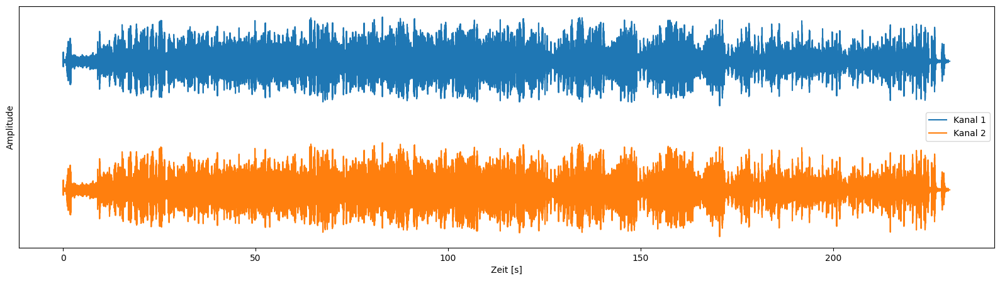

In [4]:
time = np.arange(sound.shape[1])/sound_sr
plt.figure(figsize = (20,5))
plt.plot(time, sound[0], label='Kanal 1')
plt.plot(time, sound[1]-2, label='Kanal 2')  # hier ziehen wir 2 ab, um bei anderen y-Werte zu landen
plt.ylabel('Amplitude')
plt.xlabel('Zeit [s]')
plt.legend()
_ = plt.yticks([]) # Wegen der Verschiebung von Kanal 2 stimmt die Skala nicht mehr

`IPython.display` stellt sogar eine Funktion bereit, mit der Audiodateien abgespielt werden können. Allerdings haben wir beobachtet, dass diese Methode bei Sounds, die länger als eine Minute sind, zu einem Absturz (der Colab-Session) führt.

In [5]:
from IPython.display import Audio
Audio(sound[:,:60*sound_sr],rate = sound_sr) # nur 60 Sekunden, sonst crash

## Fourier-Transformation

Der Mathematiker [Fourier](https://de.wikipedia.org/wiki/Joseph_Fourier) entwickelte im 18. Jahrhundert die Theorie, dass jedes periodische Signal als gewichtete Summe vieler Sinus-und Cosinuswellen verschiedener Frequenzen beschrieben werden kann. Mit der daraus hervorgehenden [Fourier-Transformation](https://de.wikipedia.org/wiki/Fourier-Transformation) (**FT**) kann bestimmt werden, mit welchem Anteil (mit welcher Gewichtung) jede Frequenz in einem bestimmten Signal enthalten ist. Der Frequenzgehalt eines Signals bietet nützliche Informationen, die dem Rohsignal sonst nur schwer zu entlocken wären.

### Generierung eines künstlichen Signals

Zur Veranschaulichung des oben beschriebenen Prinzips werden wir ein einfaches Signal aus Sinuswellen generieren und anschließend die Fourier-Transformation darauf anwenden. Für die Datengenerierung definieren wir eine Abtastrate und erstellen einen entsprechenden Zeitvektor. Mit einer willkürlich gewählten Zusammenstellung von Frequenzen und sogenannten Phasenverschiebungen erstellen wir darauf aufbauend verschiedene Sinuskurven.

Wie die Sinuskurven im Detail erzeugt werden ist hierbei nicht so wichtig. Bei Interesse können Sie sich die folgenden Zeilen Code natürlich gern näher anschauen.

In [6]:
sr = 4000.
tmax = 2.
time= np.arange(0, tmax, tmax/sr)

frequencies = [25, 76, 123, 197, 278, 432]
weights = [0.1, 0.3, 0.7, 0.25, 0.2, 0.02]
phases = [p*np.pi for p in [0.1, 0, -1, 0.5, 1., 1.8]]

weights = np.array(weights)
weights /= weights.sum()

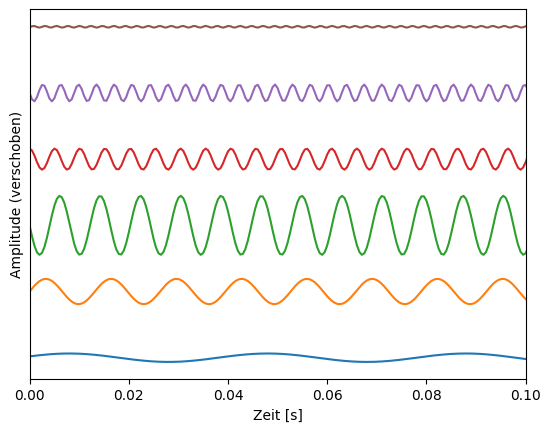

In [7]:
signals = []
offset = 0
for f, w, p in zip(frequencies, weights, phases):
    omega = 2*np.pi*f # Kreisfrequenz
    signal  = w*np.sin(omega*time + p)
    signals.append(signal)
    plt.plot(time, signal + offset)
    offset += 1  # Verschiebung entlang der y-Achse

plt.xlim(0, 0.1)
plt.yticks([])
_ = plt.xlabel('Zeit [s]')
_ = plt.ylabel('Amplitude (verschoben)')

Durch die unterschiedlichen Gewichtungen haben die einzelnen Signale verschiedene Amplituden. Wenn wir alle Kurven zusammenaddieren, entsteht ein unregelmäßig erscheinendes Signal, dessen Frequenzgehalt (also die einzelnen darin enthaltenen Frequenzen) nur noch schwer zu erkennen ist.

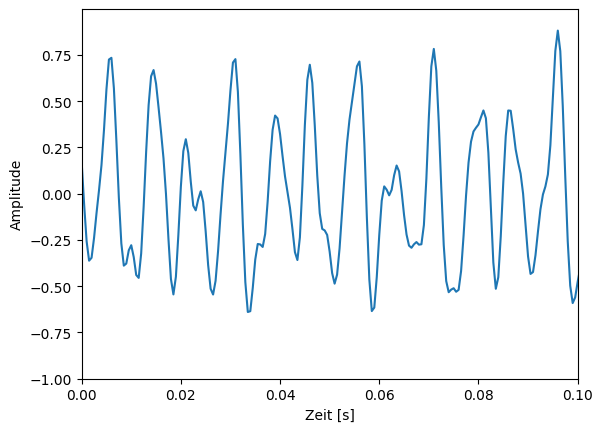

In [8]:
mixed_signal = np.array(signals).sum(axis=0)
plt.plot(time, mixed_signal)
plt.xlim(0,0.1)
_ = plt.xlabel('Zeit [s]')
_ = plt.ylabel('Amplitude')

### Fourier-Transformation auf künstlichem Signal

Wir können nun die Funktion `fft()` aus der `NumPy`-Bibliothek auf unser Signal anwenden. `fft` steht dabei für *Fast-Fourier-Transform*. Hierbei handelt es sich um eine besonders effiziente Technik der Transformation.

In [9]:
fft = np.fft.fft(mixed_signal)
print(fft)

[-7.50011164e-13+0.00000000e+00j -5.73823759e-13-4.69123562e-14j
 -4.07729406e-13-4.97102359e-13j ...  6.15746052e-14+2.63886196e-13j
 -4.04091616e-13+4.98143561e-13j -5.73823759e-13+4.69123562e-14j]


Um das Ergebnis der Transformation interpretieren zu können, müssen wir mit Hilfe der Abtastrate wieder die zugehörigen Frequenzen ausrechnen und das Ganze etwas umskalieren. Hier sind die technischen Details wieder nicht so wichtig. Die relevante Botschaft besteht darin, dass die Fourier-Transformation uns für verschiedene Frequenzen je einen Wert gibt, der beschreibt, wie stark die zugehörige Frequenz in dem Audiosignal vertreten ist.

In [10]:
magnitude = np.absolute(fft)
magnitude /= magnitude.sum()
phase = np.angle(fft)
freq = np.fft.fftfreq(fft.shape[0], tmax/sr)
print(phase)
print(freq)

[ 3.14159265 -3.06002012 -2.25774083 ...  1.34156023  2.25232637
  3.06002012]
[ 0.   0.5  1.  ... -1.5 -1.  -0.5]


Nun können die von der Fouriertransformation errechneten Frequenzanteile des Signals - das Frequenzspektrum - grafisch dargestellt werden.

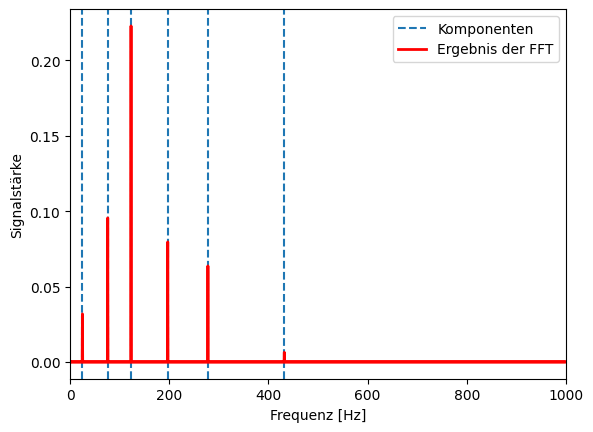

In [11]:
for f in frequencies:
    plt.axvline(f, linestyle='--')

plt.axvline(sr, linestyle='--', label='Komponenten')
plt.plot(freq, magnitude, 'red', lw=2, label='Ergebnis der FFT')

plt.xlim(0, sr/4.)
plt.xlabel('Frequenz [Hz]')
plt.ylabel('Signalstärke')
plt.legend()

Das künstlich erzeugte Signal entspricht den Annahmen des Fourier-Modells (Summe einzelner Sinustöne), und auch das errechnete Frequenzspektrum (bzw. das dargestellte Amplitudenspektrum) weist genau die Frequenzen der Einzelsignale auf, aus denen wir es zuvor durch Addition aufgebaut haben.

### Fourrier-Transformation auf echten Daten

Echte Audiodaten sind in der Regel keine Überlagerung von einfachen Sinuskurven sondern enthalten alle möglichen Frequenzen in unterschiedlichen Intensitäten.

Um dies zu veranschaulichen, wenden wir die Transformation nun auf das oben eingelesene Musikstück an. Hierfür mitteln wir über die beiden Kanäle des Stereosignals und erzeugen somit ein Monosignal. Von diesem verwenden wir nur die ersten Sekunden für die Transformation.

In [12]:
mono_sound = sound.mean(axis = 0)[:20*sound_sr]

Wie zuvor berechnen wir nun die Transformation und die zugehörige Frequenzachse.

In [13]:
fft = np.fft.fft(mono_sound)
magnitude = np.absolute(fft)
phase = np.angle(fft)
freq = np.fft.fftfreq(fft.shape[0], 1/sound_sr)
n = len(freq)
magnitude = magnitude[:int(n/2)]
freq = freq[:int(n/2)]

Für die Darstellung der verschiedenen Frequenzkomponenten verwenden wir in diesem Fall eine logarithmische Skalierung der x-Achse. Dies ermöglicht einen besseren Blick auf die Verteilung der Frequenzanteile in ganz unterschiedlichen Größenordnungen - von niedrigen Frequenzen im Bereich von wenigen Hz bis hin zu hohen Frequenzen von mehreren 10.000 Hz. Zusätzlich entspricht eine logarithmische Skala auch der Art, in der Tonhöhen vom menschlichen Gehör wahrgenommen werden.

Ebenso ist die Signalstärke der verschiedenen Frequenzkomponenten auf deutlich unterschiedliche Größenordnungen verteilt. Anders als bei der Frequenzachse werden für die Signalstärken typischerweise logarithmierte Werte auf einer linear skalierten y-Achse dargestellt.

Text(0, 0.5, 'Signalstärke')

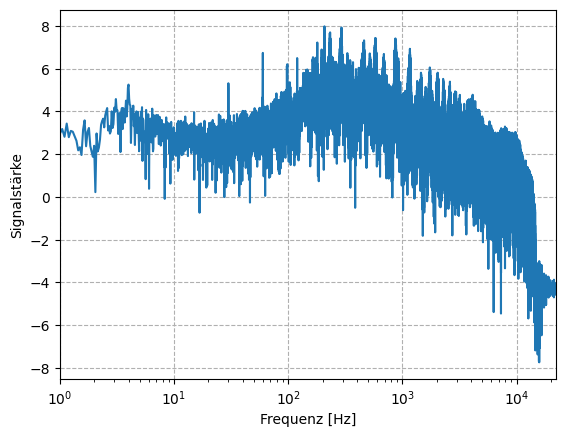

In [14]:
plt.plot(freq, np.log(magnitude))
plt.xscale('log')
plt.grid(axis='both', linestyle='--')
plt.xlim(1, sound_sr/2.)
plt.xlabel('Frequenz [Hz]')
plt.ylabel('Signalstärke')

## Spektrogramm: zeitaufgelöste Frequenzinformation

Bisher haben wir das Frequenzspektrum ganzer Signale berechnet. Dies gibt uns Aufschluss darüber, wie stark die einzelnen Frequenzen im Mittel im Signal vertreten sind, und periodische Signale können anhand des Spektrums verlustfrei rekonstruiert werden.

Ton ist aber ein grundsätzlich zeitbasiertes Medium. Es ist daher wichtig, auch zu einer zeitaufgelösten Übersicht über den Frequenzgehalt zu gelangen, aus der entsprechend hervor geht, zu welchem Zeitpunkt welche Frenquenzen auftreten. Eine instantane Frequenzanalyse (also für einen einzelnen Zeitpunkt) ist jedoch nicht möglich, da eine gewisse Länge an Signal benötigt wird, um überhaupt von Frequenzen reden zu können. Technisch wird das ganze mit Hilfe der sogenannten [Kurzzeit-Fourier-Transformation](https://de.wikipedia.org/wiki/Kurzzeit-Fourier-Transformation) - auf Englisch [Short-Time Fourier transform](https://en.wikipedia.org/wiki/Short-time_Fourier_transform) - gelöst.

### Short-Time-Fourier-Transform (STFT)

Bei der STFT wird die herkömmliche **FT** für viele kurze Zeitfenster entlang des gesamten Signals berechnet. Ähnlich der Faltung wird dabei also ein Fenster Schritt für Schritt über das Signal bewegt, wobei sich dabei benachbarte Ausschnitte in der Regel überlappen. Das Ergebnis ist eine Frequenzverteilung bzw. ein Frequenzspektrum für jeden einzelnen Ausschnitt. Aus allen Frequnzspektren hintereinander kann dann eine zweidimensionale Darstellung der Frequenzverteilung über die Zeit erzeugt werden kann.

Diese Darstellung, auch *Spektrogramm* genannt, erzeugen wir nun mit Hilfe von `librosa` für die eingelesene Musikdatei. Die entscheidenden Paramter für die Funktion `stft()` sind
- `n_fft`: Die Fensterbreite für die Berechnung der einzelnen *FFTs*.
- `hop_length`: Die Anzahl der Signalwerte, um die das Fenster in jedem Schritt verschoben wird.

Mit den unten gewählten Parametern `n_fft = 2048` und `hop_length = 1024` überlappen sich die Ausschnitte also um eine halbe Fensterbreite.

---

**Anmerkungen**

Für diese Parameter werden zumeist Zweierpotenzen verwendet, da dies mit einer effizienteren Berechnung der FFT einhergeht.

In [15]:
# Berechnung des Spektrogramms
hop_length = 1024
n_fft = 2048
stft = librosa.stft(mono_sound, hop_length=hop_length, n_fft=n_fft)  # viele "lokale" Spektren
spec = librosa.amplitude_to_db(abs(stft)) # Berechnung der Amplitudenspektren

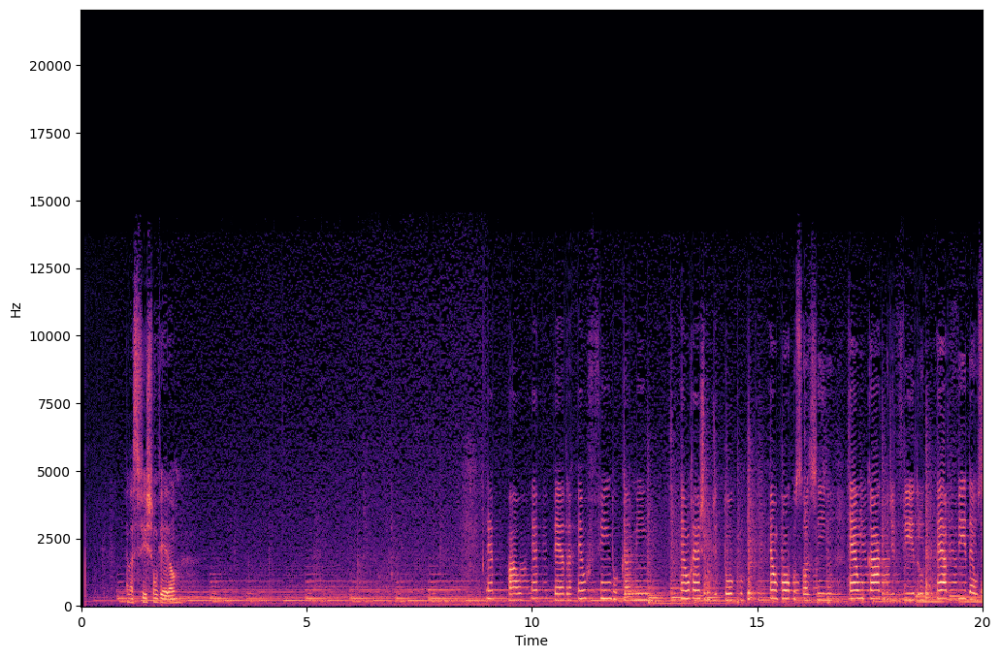

In [16]:
# Darstellung des Spektrogramms mit librosa
plt.figure(figsize = (12, 8))
librosa.display.specshow(spec, sr=sound_sr, hop_length=hop_length, x_axis='time', y_axis='linear', cmap='magma')

Die Farbe zeigt die Intensität des Schalls zu verschiedenen Zeiten und Frequenzen an. Wir sehen also, dass sich der Frequenzgehalt mit der Zeit deutlich ändert. In der zeitlichen Struktur ist auch die Rhythmik des Musikstückes zu erkennen. Dass oberhalb von 14 kHz nicht mehr viel los ist, mag vielleicht an der mp3-Kompression liegen.

### Aufgabe: Parameter `n_fft`

Verändern Sie den Parameter `n_fft`: Testen Sie die Auswirkungen des Parameters für kleine und große Werte (z.b. 64 und 16384). Welchen Einfluss auf das Aussehen des Spektrogramms beobachten Sie und wie erklären Sie sich dies?

### Aufgabe: Parameter `hop_length`

Verändern Sie den Parameter `hop_length`: Testen Sie die Auswirkungen des Parameters für kleine und große Werte (z.b. 64 und 16384). Welchen Einfluss auf das Aussehen des Spektrogramms beobachten Sie und wie erklären Sie sich dies?

### Mel-Frequenz-Cepstrum-Koeffizienten

Weiter oben wurde angedeutet, dass das menschliche Gehör Tonhöhen gemäß logarithmischen Skala wahrnimmt. Dieses Phänomen wurde mit der Toneinheit [Mel](https://de.wikipedia.org/wiki/Mel) in den Dreißigerjahren quantifiziert. Werden Menschen aufgefordert, den Abstand zwischen Tönen subjektiv zu bewerten, so werden als ähnlich eingestufte Abstände mit zunehmender Tonhöhe (zunehmender Frequenz) immer größer.

Die [Mel-Frequenz-Cepstrum-Koeffizienten](https://de.wikipedia.org/wiki/Mel_Frequency_Cepstral_Coefficients) (**MFCs**) machen sich dieses Prinzip zunutze, indem die betrachteten Frequenzen hier so gewählt werden, dass sie auf der Mel-Skala den gleichen Abstand haben. Zusätzlich wird bei der Berechnung der Koeffizienten angenommen, dass menschliche Sprache aus zwei Komponenten besteht: Einerseits aus der Erzeugung von Schwingungen durch die Stimmbänder und andererseits aus der Modulation dieser Schwingungen durch Mund, Zunge und Rachen. Die Schwingung der Stimmbänder bestimmt die Tonhöhe, während die in der Sprache enthaltene Information durch die Formung des Klangs im Vokaltrakt erzeugt wird.

Hinter den mathematischen Tricks, die bei der Bestimmung der MFCs verwendet werden, verbirgt sich die Absicht, diese beiden Komponenten zu entkoppeln, so dass nur die Sprachinformation - unabhängig von der Tonhöhe - kodiert werden kann. Die **MFCs** sind in der automatischen Spracherkennung weit verbreitet und finden auch in der Analyse von Musik Anwendung. `librosa` bietet uns die Möglichkeit, diese Koeffizienten für Audiodaten zu berechenen. Daher können wir diese Funktion auch auf unsere mp3-Datei anwenden.

In [20]:
# Berechnung des Mel-Spektrogramms
n_fft = 2048
hop_length = 1024
n_mels = 64
melspec = librosa.feature.melspectrogram(y= mono_sound, sr=sound_sr, n_fft=n_fft,
                                         hop_length=hop_length, n_mels=n_mels)
logmelspec = librosa.power_to_db(abs(melspec))

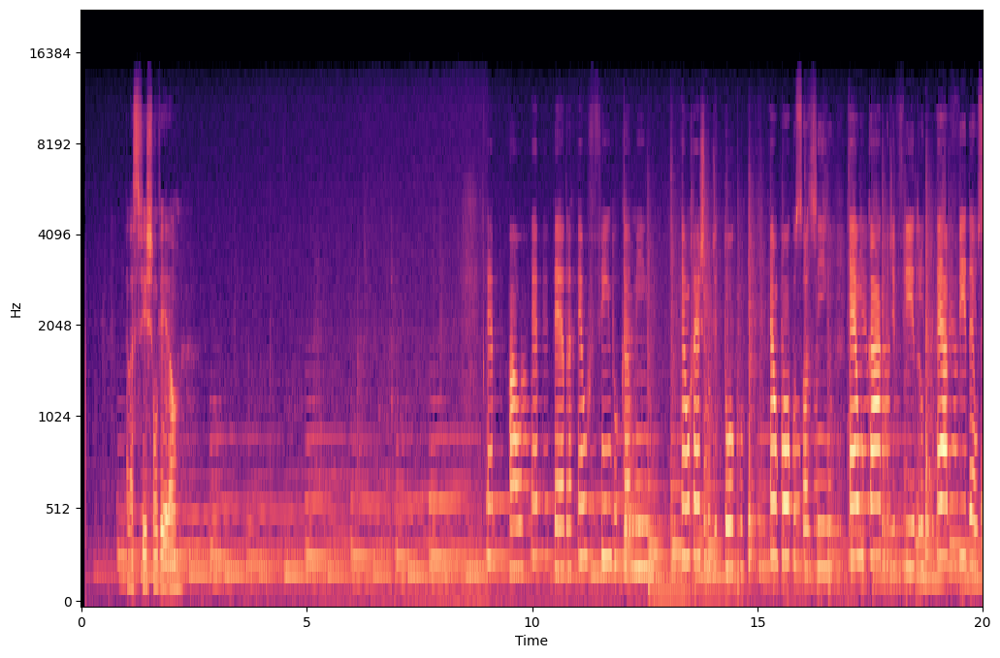

In [21]:
# Darstellung des Mel-Spektrogramms
plt.figure(figsize = (12,8))
librosa.display.specshow(logmelspec,sr=sound_sr, hop_length=hop_length,
                         x_axis='time', y_axis='mel', cmap='magma')

Beim Vergleich dss Mel-Spektrogramms mit dem herkömmlichen Spektrogramm fällt auf, dass die Information deutlich komprimiert wurde. Die gleichen Strukturen werden kompakter dargestellt und die schwarzen (leeren) Flächen, die keine Information enthalten hatten, sind in großen Teilen verschwunden. Auch ist die Auflösung in der Frequenzdimension stark reduziert und das Spektrogramm beinhaltet keine Informationen mehr zu Frequenzen oberhalb von ca. 8kHz. Wie wir in Abschnitt 8.3 des nächsten Notebooks sehen werden macht sich diese Art der Kompression trotz eines gewissen Informationsverlusts in der weiteren Verarbeitung dennoch bezahlt.

### Aufgabe: Parameter `n_mels`

Im Vergleich zum herkömmlichen Spektrogramm ist der Paramter `n_mels` hinzugekommen. Können Sie sich vorstellen, was dieser bewirkt? Unteruchen Sie seine Auswirkungen auf das resultierende Mel-Spektrogramm, indem Sie verschiedene Werte auttesten (z.B. 16, 64, 128).
